In [1]:
# 设置中文字体
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rc("font", family="SimHei") 

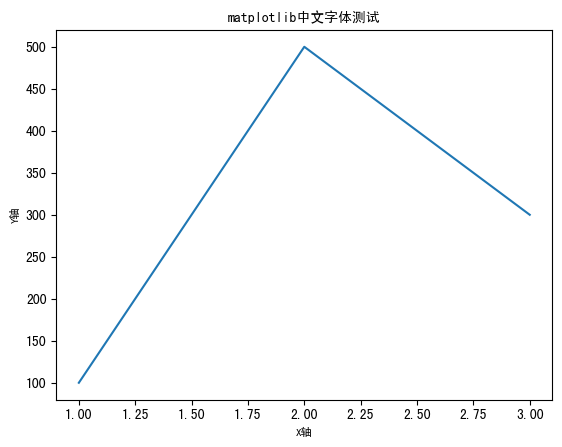

In [2]:
# 中文字体测试
plt.plot([1,2,3], [100,500,300])
plt.title("matplotlib中文字体测试", fontsize=10)
plt.xlabel("X轴", fontsize=8)
plt.ylabel("Y轴", fontsize=8)
plt.show()

### 安装 MMSegmentation

In [3]:
# 检查平台上 PyTorch 版本
!pip list | grep torch

functorch                0.2.0
torch                    1.12.1+cu113
torchaudio               0.12.1+cu113
torchtext                0.13.1
torchvision              0.13.1+cu113
torchviz                 0.0.2
torchx                   0.5.0


In [5]:
# # 下载MMSegmentation
# !rm -rf mmsegmentation

In [4]:
# # 从 github 上下载最新的 mmsegmentation 源代码
# !git clone https://github.com/open-mmlab/mmsegmentation.git -b dev-1.x

fatal: destination path 'mmsegmentation' already exists and is not an empty directory.


In [1]:
# 安装openmim
!pip install -U openmim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 11.1 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.4/239.4 kB 17.4 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 4.1 kB/s eta 0:00:00a 0:00:02m


In [6]:
# 安装mmengine、mmcv和mmdet
!mim install mmengine
!mim install 'mmcv==2.0.0rc4'
!mim install 'mmdet>=3.0.0rc1' -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.12.0/index.html
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.12.0/index.html
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.12.0/index.html


In [7]:
# 通过mim基于源码进行安装
%cd mmsegmentation
!pip install -v -e . -i https://pypi.tuna.tsinghua.edu.cn/simple 
%cd -

/gemini/code/MMSegmentation Tutorial/mmsegmentation
Using pip 23.1.2 from /usr/local/lib/python3.8/dist-packages/pip (python 3.8)
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Obtaining file:///gemini/code/MMSegmentation%20Tutorial/mmsegmentation
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-7o2topr4/mmsegmentation.egg-info
  writing /tmp/pip-pip-egg-info-7o2topr4/mmsegmentation.egg-info/PKG-INFO
  writing dependency_links to /tmp/pip-pip-egg-info-7o2topr4/mmsegmentation.egg-info/dependency_links.txt
  writing requirements to /tmp/pip-pip-egg-info-7o2topr4/mmsegmentation.egg-info/requires.txt
  writing top-level names to /tmp/pip-pip-egg-info-7o2topr4/mmsegmentation.egg-info/top_level.txt
  writing manifest file '/tmp/pip-pip-egg-info-7o2topr4/mmsegmentation.egg-info/SOURCES.txt'
  reading manifest file '/tmp/pip-pip-egg-info-7o2topr4/mmsegmentation.egg-info/SOURCES.txt'
  reading manifest template 'MANIFEST.in'
  writing 

In [8]:
# 检查CUDA
import torch, torchvision
print(torch.cuda.is_available())

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True


In [9]:
import sys
import os
sys.path.insert(1, os.path.join(os.getcwd(), "mmsegmentation"))

# 检查mmsegmentation版本
import mmseg
print(mmseg.__version__)

1.0.0


In [10]:
# 检查 mmcv
import mmcv
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(mmcv.__version__)
print(get_compiling_cuda_version())
print(get_compiler_version())

2.0.0rc4
11.3
GCC 9.3


### 使用预训练模型对图片进行预测

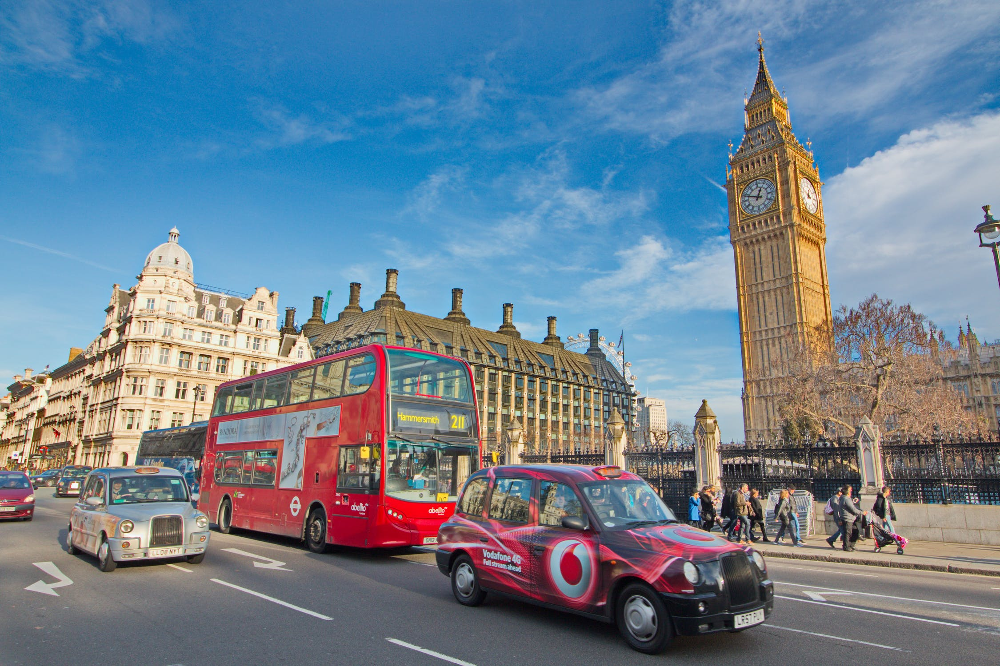

In [11]:
from PIL import Image
# 加载图片
Image.open("data/street_uk.jpeg")

In [12]:
# 通过命令行预测图片
!python mmsegmentation/demo/image_demo.py \
        data/street_uk.jpeg \
        mmsegmentation/configs/pspnet/pspnet_r50-d8_4xb2-40k_cityscapes-512x1024.py \
        checkpoint/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth \
        --out-file outputs/B1_uk_pspnet.jpg \
        --device cuda:0 \
        --opacity 0.5

/gemini/code/MMSegmentation Tutorial/mmsegmentation/mmseg/models/builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
/gemini/code/MMSegmentation Tutorial/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:235: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(
Loads checkpoint by local backend from path: checkpoint/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth
06/19 14:43:23 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


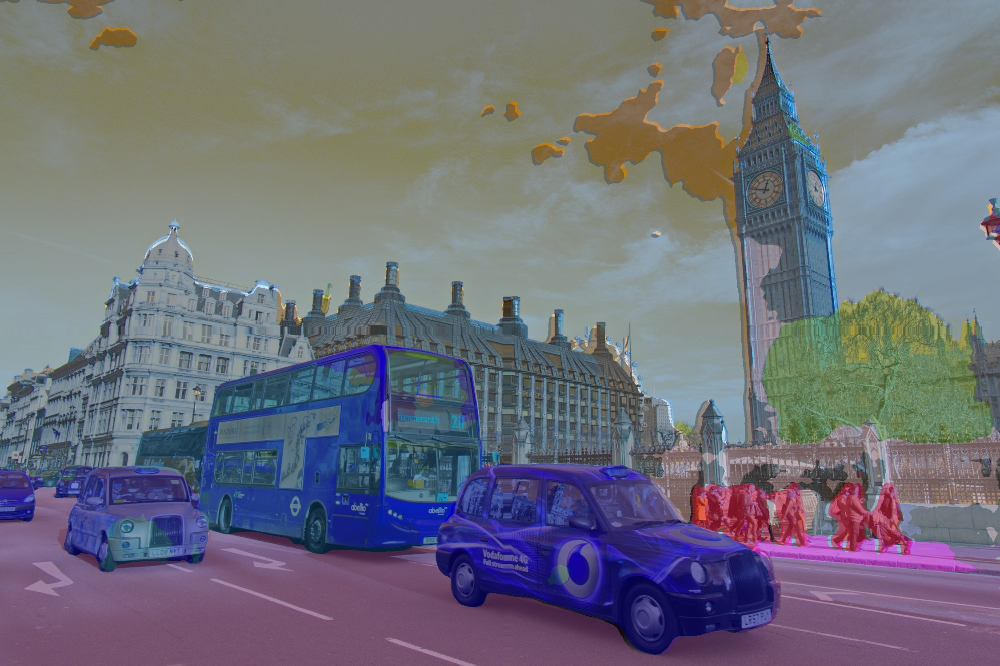

In [13]:
# 加载预测图片
Image.open("outputs/B1_uk_pspnet.jpg")

### 使用预训练模型预测视频

In [13]:
# 通过命令行预测视频
!python mmsegmentation/demo/video_demo.py \
        data/street_20220330_174028.mp4 \
        mmsegmentation/configs/pspnet/pspnet_r50-d8_4xb2-40k_cityscapes-512x1024.py \
        checkpoint/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth \
        --device cuda:0 \
        --output-file outputs/B3_video.mp4 \
        --opacity 0.5

/project/train/src_repo/MMSegmentation Tutorial/mmsegmentation/mmseg/models/builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
/project/train/src_repo/MMSegmentation Tutorial/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '
Loads checkpoint by local backend from path: checkpoint/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth
OpenCV: FFMPEG: tag 0x47504a4d/'MJPG' is not supported with codec id 7 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
06/14 20:59:56 - mmengine - WARNING - `Visualizer` backe

In [14]:
# 通过Python API预测视频
import numpy as np
import time
import shutil

import torch

from PIL import Image
import cv2

import mmcv
import mmengine
from mmseg.apis import inference_model
from mmseg.utils import register_all_modules
register_all_modules()

from mmseg.datasets import CityscapesDataset

In [15]:
# 模型 config 配置文件
config_file = "mmsegmentation/configs/pspnet/pspnet_r50-d8_4xb2-40k_cityscapes-512x1024.py"

# 模型 checkpoint 权重文件
checkpoint_file = "checkpoint/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth"

In [16]:
from mmseg.apis import init_model
model = init_model(config_file, checkpoint_file, device='cuda:0')

from mmengine.model.utils import revert_sync_batchnorm
if not torch.cuda.is_available():
    model = revert_sync_batchnorm(model)

/gemini/code/MMSegmentation Tutorial/mmsegmentation/mmseg/models/builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
/gemini/code/MMSegmentation Tutorial/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:235: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


Loads checkpoint by local backend from path: checkpoint/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth


In [17]:
# input_video = 'data/traffic.mp4'

input_video = 'data/street_20220330_174028.mp4'

In [18]:
# 创建临时文件夹 存放每帧结果
temp_out_dir = time.strftime('%Y%m%d%H%M%S')
os.mkdir(temp_out_dir)
print("创建临时文件夹 {} 用于存放每帧预测结果".format(temp_out_dir))

创建临时文件夹 20230619144550 用于存放每帧预测结果


In [19]:
# 获取 Cityscapes 街景数据集 类别名和调色板
from mmseg.datasets import cityscapes
classes = cityscapes.CityscapesDataset.METAINFO['classes']
palette = cityscapes.CityscapesDataset.METAINFO['palette']

In [20]:
def pridict_single_frame(img, opacity=0.2):
    
    result = inference_model(model, img)
    
    # 将分割图按调色板染色
    seg_map = np.array(result.pred_sem_seg.data[0].detach().cpu().numpy()).astype('uint8')
    seg_img = Image.fromarray(seg_map).convert('P')
    seg_img.putpalette(np.array(palette, dtype=np.uint8))
    
    show_img = (np.array(seg_img.convert('RGB')))*(1-opacity) + img*opacity
    
    return show_img

In [21]:
# 读入待预测视频
imgs = mmcv.VideoReader(input_video)

prog_bar = mmengine.ProgressBar(len(imgs))

# 对视频逐帧处理
for frame_id, img in enumerate(imgs):
    
    ## 处理单帧画面
    show_img = pridict_single_frame(img, opacity=0.15)
    temp_path = f'{temp_out_dir}/{frame_id:06d}.jpg' # 保存语义分割预测结果图像至临时文件夹
    cv2.imwrite(temp_path, show_img)

    prog_bar.update() # 更新进度条

# 把每一帧串成视频文件
mmcv.frames2video(temp_out_dir, 'outputs/B3_video.mp4', fps=imgs.fps, fourcc='mp4v')

shutil.rmtree(temp_out_dir) # 删除存放每帧画面的临时文件夹
print('删除临时文件夹', temp_out_dir)

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 138/138, 24.6 task/s, elapsed: 6s, ETA:     0s[                                                  ] 0/138, elapsed: 0s, ETA:
删除临时文件夹 20230619144550
